# Carga de archivos

In [19]:
""" from google.cloud import drive
drive.mount('/content/drive') """

" from google.cloud import drive\ndrive.mount('/content/drive') "

In [ ]:
import os
import collections
import numpy as np
from PIL import Image
import keras

""" folder_path = '/content/drive/My Drive/MachineLearning/MachineLearning/Dataset' """

# Versión 0

folder_path = './Dataset'
labels = {
    "arroz": 0,
    "bebidas": 1,
    "conservas": 2,
    "pastas": 3,
    "snacks": 4,
    "yogures": 5
}

loaded_files = []
image_list = []
y = []
num_classes = len(labels)

for category, label in labels.items():
    category_path = os.path.join(folder_path, category)
    for filename in os.listdir(category_path):
        if filename.lower().endswith((".jpg", ".png", ".jpeg")):
            try:
                img_path = os.path.join(category_path, filename)
                img = Image.open(img_path).convert("RGB")
                img = img.resize((224, 224))
                img_array = np.array(img) / 255.0
                image_list.append(img_array)
                y.append(label)
                loaded_files.append(os.path.join(category, filename))
            except Exception as e:
                print(f"Error al abrir {filename}: {e}")

counts = collections.Counter(y)

c:\Users\Marce\OneDrive\Documentos\Github\ML04\env\Lib\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


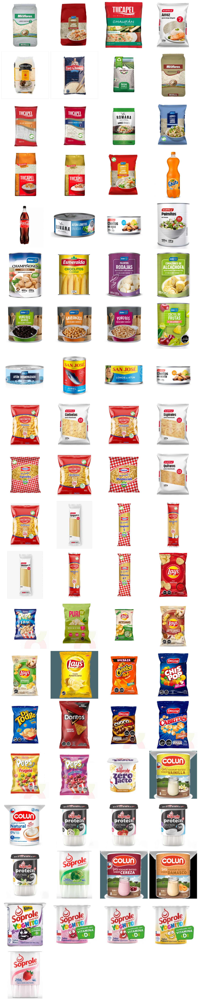

In [21]:
%matplotlib inline
import matplotlib.pyplot as plt

nImagenes = len(image_list)
columnas = 4
filas = (nImagenes + columnas - 1) // columnas

fig, axes = plt.subplots(filas, columnas, figsize=(16, 4 * filas))
axes = axes.flatten()

for i in range(nImagenes):
    axes[i].imshow(image_list[i])
    axes[i].axis('off')

for j in range(nImagenes, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [22]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(image_list, y, test_size=0.2, random_state=42, stratify=y)

In [23]:
X_train = np.array(X_train)
y_train_one_hot = keras.utils.to_categorical(y_train, num_classes)

X_test = np.array(X_test)
y_test_one_hot = keras.utils.to_categorical(y_test, num_classes)

In [24]:
from keras import datasets, layers, models
from keras.models import Sequential
from keras.layers import Dense, Flatten
from keras import regularizers
keras.utils.set_random_seed(812)
np.random.seed(812)

model = models.Sequential()

l2_strength = 0.001

model.add(layers.Conv2D(64, (3,3), activation='relu', input_shape=(224, 224, 3), kernel_regularizer=regularizers.l2(l2_strength)))
model.add(layers.MaxPooling2D((2,2)))

model.add(layers.Conv2D(64, (3,3), activation='relu', kernel_regularizer=regularizers.l2(l2_strength)))
model.add(layers.MaxPooling2D((2,2)))

model.add(layers.Flatten())
model.add(layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(l2_strength)))
model.add(layers.Dense(num_classes, activation='softmax'))

c:\Users\Marce\OneDrive\Documentos\Github\ML04\env\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [25]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [26]:
y_train = keras.utils.to_categorical(y_train, num_classes)

In [27]:
ajuste = %time model.fit(X_train,y_train,epochs=30,batch_size=16,validation_data=(X_test, y_test_one_hot))

Epoch 1/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 696ms/step - accuracy: 0.1475 - loss: 11.8678 - val_accuracy: 0.1875 - val_loss: 5.7117
Epoch 2/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 546ms/step - accuracy: 0.3279 - loss: 3.2875 - val_accuracy: 0.1875 - val_loss: 1.9546
Epoch 3/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 555ms/step - accuracy: 0.5902 - loss: 1.6156 - val_accuracy: 0.4375 - val_loss: 1.7872
Epoch 4/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 809ms/step - accuracy: 0.7869 - loss: 1.1424 - val_accuracy: 0.6250 - val_loss: 1.8172
Epoch 5/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 807ms/step - accuracy: 0.9016 - loss: 0.7769 - val_accuracy: 0.6875 - val_loss: 1.4828
Epoch 6/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 725ms/step - accuracy: 0.9836 - loss: 0.5900 - val_accuracy: 0.6875 - val_loss: 1.4083
Epoch 7/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 714ms/step - accuracy: 1.0000 - loss: 0.5061 - val_accuracy: 0.6875 - val_loss: 1.6451
Epoch 8/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 766ms/step - accuracy: 1.0000 - loss: 0.5030 - val_accuracy: 0.6875 - val_loss

In [28]:
y_test = keras.utils.to_categorical(y_test, num_classes)

In [29]:
y_pred = model.predict(X_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


In [30]:
y_pred=np.round(y_pred)
y_pred

array([[1., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1., 0.],
       [1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 0., 0.]], dtype=float32)

In [31]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [32]:
import pandas as pd
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, mean_absolute_error, mean_squared_error, r2_score

conf_matrix = confusion_matrix(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)

precision = precision_score(y_test, y_pred, average=None)
precision_avg = precision_score(y_test, y_pred, average="macro")
recall = recall_score(y_test, y_pred, average=None)
recall_avg = recall_score(y_test, y_pred, average="macro")
f1 = f1_score(y_test, y_pred, average=None)
f1_avg = f1_score(y_test, y_pred, average="macro")
print("Exactitud:", accuracy)
print("Precisión por clase:", precision,'->', precision_avg)
print("Sensibilidad por clase:", recall,'->', recall_avg)
print("F1 Score por clase:", f1,'->', f1_avg)

Exactitud: 0.6875
Precisión por clase: [0.5        0.         0.66666667 0.75       0.5        1.        ] -> 0.5694444444444444
Sensibilidad por clase: [0.66666667 0.         0.66666667 1.         0.33333333 1.        ] -> 0.611111111111111
F1 Score por clase: [0.57142857 0.         0.66666667 0.85714286 0.4        1.        ] -> 0.5825396825396826


c:\Users\Marce\OneDrive\Documentos\Github\ML04\env\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Marce\OneDrive\Documentos\Github\ML04\env\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


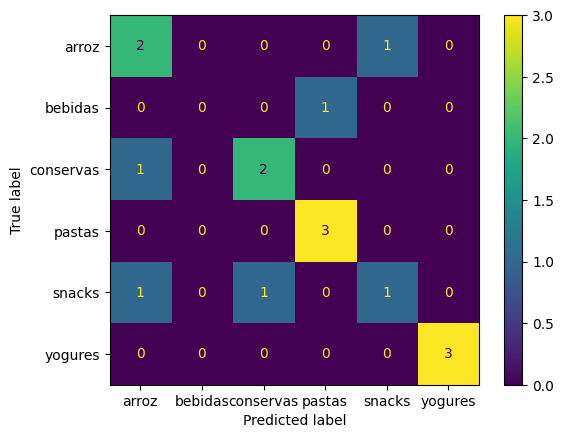

In [33]:
from sklearn.metrics import ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.display_labels = ['arroz','bebidas','conservas','pastas','snacks','yogures']
disp.plot()

Verificación de la Matriz de Confusión:
Imagen: arroz\1.jpg, Etiqueta Real: snacks, Etiqueta Predicha: arroz
Imagen: arroz\10.jpg, Etiqueta Real: arroz, Etiqueta Predicha: arroz
Imagen: arroz\11.jpg, Etiqueta Real: bebidas, Etiqueta Predicha: pastas
Imagen: arroz\12.jpg, Etiqueta Real: pastas, Etiqueta Predicha: pastas
Imagen: arroz\13.jpg, Etiqueta Real: snacks, Etiqueta Predicha: conservas
Imagen: arroz\14.jpg, Etiqueta Real: snacks, Etiqueta Predicha: snacks
Imagen: arroz\15.jpg, Etiqueta Real: conservas, Etiqueta Predicha: conservas
Imagen: arroz\2.jpg, Etiqueta Real: pastas, Etiqueta Predicha: pastas
Imagen: arroz\3.jpg, Etiqueta Real: conservas, Etiqueta Predicha: conservas
Imagen: arroz\4.jpg, Etiqueta Real: pastas, Etiqueta Predicha: pastas
Imagen: arroz\5.jpg, Etiqueta Real: yogures, Etiqueta Predicha: yogures
Imagen: arroz\6.jpg, Etiqueta Real: arroz, Etiqueta Predicha: snacks
Imagen: arroz\7.jpg, Etiqueta Real: arroz, Etiqueta Predicha: arroz
Imagen: arroz\8.jpg, Etiqueta Re

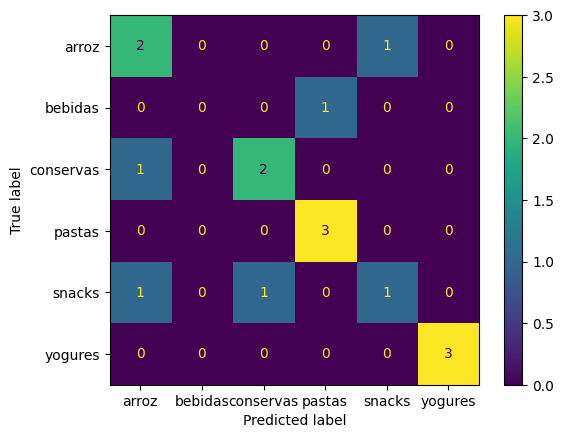

In [34]:
# Display image names, actual labels, and predicted labels for verification
reverse_labels = {v: k for k, v in labels.items()}

print("Verificación de la Matriz de Confusión:")
for i in range(len(X_test)):
    actual_label = reverse_labels[y_test[i]]
    predicted_label = reverse_labels[y_pred[i]]
    print(f"Imagen: {loaded_files[i]}, Etiqueta Real: {actual_label}, Etiqueta Predicha: {predicted_label}")

from sklearn.metrics import ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.display_labels = ['arroz','bebidas','conservas','pastas','snacks','yogures']
disp.plot()